# SciCar 2023

This explains shows a visualisation of sea ice, based on access to climate data accessed from xcube. This notebook has been adapted from the [Cate Education Repository](https://github.com/CCI-Tools/cate-edu) to needs of the SciCAR 2023. It requires that (a) users install the [xcube-cci plugin](https://github.com/dcs4cop/xcube-cci). We'll be querying the Open Data Portal for sea ice concentration products as produced by the [Climate Change Initiative Sea Ice project](https://climate.esa.int/en/projects/sea-ice/). The [**Open Data Portal**](https://climate.esa.int/en/odp/#/dashboard) hosts a variety of datasets on the [Jasmin infrastructure on the UK](https://jasmin.ac.uk/). These can be queried using the xcube-cci plugin.

Once more, we start with data imports. Here, we also import basic packages numpy and datetime to customise operations.

In [1]:
from IPython.display import display

import numpy as np
from datetime import datetime

from xcube.core.store import new_data_store

We create the ccizarr store and list its contents.

In [2]:
cci_store='ccizarr'

data_store = new_data_store(cci_store)

display(data_store.get_search_params_schema())

list(data_store.get_data_ids())

['ESACCI-BIOMASS-L4-AGB-MERGED-100m-2010-2018-fv2.0.zarr',
 'ESACCI-BIOMASS-L4-AGB-MERGED-100m-2010-2020-fv4.0.zarr',
 'ESACCI-GHG-L2-CH4-SCIAMACHY-WFMD-2002-2011-fv1.zarr',
 'ESACCI-GHG-L2-CO2-OCO-2-FOCAL-2014-2021-v10.zarr',
 'ESACCI-GHG-L2-CO2-SCIAMACHY-WFMD-2002-2012-fv1.zarr',
 'ESACCI-ICESHEETS_Antarctica_GMB-2002-2016-v1.1.zarr',
 'ESACCI-ICESHEETS_Greenland_GMB-2003-2016-v1.1.zarr',
 'ESACCI-L3C_CLOUD-CLD_PRODUCTS-AVHRR_NOAA-1982-2016-fv3.0.zarr',
 'ESACCI-L3C_SNOW-SWE-1979-2018-fv1.0.zarr',
 'ESACCI-L3C_SNOW-SWE-1979-2020-fv2.0.zarr',
 'ESACCI-L4_GHRSST-SST-GMPE-GLOB_CDR2.0-1981-2016-v02.0-fv01.0.zarr',
 'ESACCI-LAKES-L3S-LK_PRODUCTS-MERGED-1992-09-fv2.0.1.zarr',
 'ESACCI-LC-L4-LCCS-Map-300m-P1Y-1992-2015-v2.0.7b.zarr',
 'ESACCI-LST-L3C-LST-MODISA-0.01deg_1DAILY_DAY-2002-2018-fv3.00.zarr',
 'ESACCI-LST-L3C-LST-MODISA-0.01deg_1DAILY_NIGHT-2002-2018-fv3.00.zarr',
 'ESACCI-OC-L3S-IOP-MERGED-1M_MONTHLY_4km_GEO_PML_OCx_QAA-1997-2020-fv5.0.zarr',
 'ESACCI-PERMAFROST-L4-ALT-MODISLST-

Of these, we pick "ESACCI-SEAICE-L4-SICONC-AMSR_50.0kmEASE2-NH-2002-2017-fv2.1.zarr", the 50 km resolution sea ice concentration dataset which has daily values. We use the option 'describe_data' to display the dataset's metadata first before opening it.

In [3]:
dataset_id = "ESACCI-SEAICE-L4-SICONC-AMSR_50.0kmEASE2-NH-2002-2017-fv2.1.zarr"

#describe the dataset
seaice_descriptor = data_store.describe_data(dataset_id)
display(seaice_descriptor)    

Now we open it.

In [4]:
seaIceDataset = data_store.open_data(dataset_id)
seaIceDataset

<xarray.Dataset>
Dimensions:                   (time: 5137, yc: 216, xc: 216, nv: 2)
Coordinates:
    lat                       (yc, xc) float32 dask.array<chunksize=(216, 216), meta=np.ndarray>
    lon                       (yc, xc) float32 dask.array<chunksize=(216, 216), meta=np.ndarray>
  * time                      (time) datetime64[ns] 2002-06-01T12:00:00 ... 2...
    time_bnds                 (time, nv) datetime64[ns] dask.array<chunksize=(160, 2), meta=np.ndarray>
  * xc                        (xc) float64 -5.375e+03 -5.325e+03 ... 5.375e+03
  * yc                        (yc) float64 5.375e+03 5.325e+03 ... -5.375e+03
Dimensions without coordinates: nv
Data variables:
    algorithm_standard_error  (time, yc, xc) float64 dask.array<chunksize=(160, 216, 216), meta=np.ndarray>
    ice_conc                  (time, yc, xc) float64 dask.array<chunksize=(160, 216, 216), meta=np.ndarray>
    raw_ice_conc_values       (time, yc, xc) float64 dask.array<chunksize=(160, 216, 216), meta=np.ndarray>
    smearing_standard_error   (time, yc, xc) float64 dask.array<chunksize=(160, 216, 216), meta=np.ndarray>
    status_flag               (time, yc, xc) float32 dask.array<chunksize=(160, 216, 216), meta=np.ndarray>
    total_standard_error      (time, yc, xc) float64 dask.array<chunksize=(160, 216, 216), meta=np.ndarray>
Attributes: (12/41)
    Conventions:               CF-1.6 ACDD-1.3
    Lambert_Azimuthal_Grid:    -2147483647
    algorithm:                 SICCI2VLF (6V, 37V, 37H)
    cdm_data_type:             Grid
    contributor_name:          Leif Toudal Pedersen, Gorm Dybkjaer, Steinar E...
    contributor_role:          PrincipalInvestigator,author,author,author,aut...
    ...                        ...
    time_coverage_end:         19700101T000001
    time_coverage_resolution:  P1D
    time_coverage_start:       19700101T000001
    title:                     Sea Ice Concentration Climate Data Record from...
    topiccategory:             Oceans ClimatologyMeteorologyAtmosphere
    tracking_id:               19fbb910-dd02-4b1f-a078-a69ed3883d4b

Once the data is loaded we can use the plotting function of [xarray](http://xarray.pydata.org/en/stable/generated/xarray.DataArray.plot.html) for a quick visualization. You can also try to plot a different day. by changing the `ithday` parameter

plotting sea ice at 2003-01-08


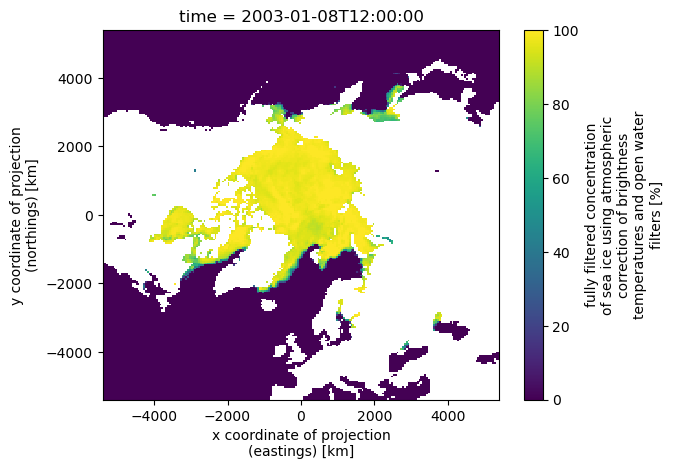

In [5]:
# Plot the sea ice concentration on a chosen day
%matplotlib inline

ithday = 204
print(f"plotting sea ice at {np.datetime_as_string(seaIceDataset.time[ithday], unit='D')}")
seaIceDataset.ice_conc.isel(time=ithday).plot()

Now, we want to only look at the data from the year 2012, so we create a temporal subset.

In [6]:
year = 2012

subSeaIceDataset = seaIceDataset.sel(time=slice(f'{year}-1-1', f'{year}-12-31'))
subSeaIceDataset

<xarray.Dataset>
Dimensions:                   (time: 162, yc: 216, xc: 216, nv: 2)
Coordinates:
    lat                       (yc, xc) float32 dask.array<chunksize=(216, 216), meta=np.ndarray>
    lon                       (yc, xc) float32 dask.array<chunksize=(216, 216), meta=np.ndarray>
  * time                      (time) datetime64[ns] 2012-07-23T12:00:00 ... 2...
    time_bnds                 (time, nv) datetime64[ns] dask.array<chunksize=(136, 2), meta=np.ndarray>
  * xc                        (xc) float64 -5.375e+03 -5.325e+03 ... 5.375e+03
  * yc                        (yc) float64 5.375e+03 5.325e+03 ... -5.375e+03
Dimensions without coordinates: nv
Data variables:
    algorithm_standard_error  (time, yc, xc) float64 dask.array<chunksize=(136, 216, 216), meta=np.ndarray>
    ice_conc                  (time, yc, xc) float64 dask.array<chunksize=(136, 216, 216), meta=np.ndarray>
    raw_ice_conc_values       (time, yc, xc) float64 dask.array<chunksize=(136, 216, 216), meta=np.ndarray>
    smearing_standard_error   (time, yc, xc) float64 dask.array<chunksize=(136, 216, 216), meta=np.ndarray>
    status_flag               (time, yc, xc) float32 dask.array<chunksize=(136, 216, 216), meta=np.ndarray>
    total_standard_error      (time, yc, xc) float64 dask.array<chunksize=(136, 216, 216), meta=np.ndarray>
Attributes: (12/41)
    Conventions:               CF-1.6 ACDD-1.3
    Lambert_Azimuthal_Grid:    -2147483647
    algorithm:                 SICCI2VLF (6V, 37V, 37H)
    cdm_data_type:             Grid
    contributor_name:          Leif Toudal Pedersen, Gorm Dybkjaer, Steinar E...
    contributor_role:          PrincipalInvestigator,author,author,author,aut...
    ...                        ...
    time_coverage_end:         19700101T000001
    time_coverage_resolution:  P1D
    time_coverage_start:       19700101T000001
    title:                     Sea Ice Concentration Climate Data Record from...
    topiccategory:             Oceans ClimatologyMeteorologyAtmosphere
    tracking_id:               19fbb910-dd02-4b1f-a078-a69ed3883d4b

To find out how the sea ice concentration behaves over time, we will make an - admittedly elaborate - animation using matplotlib.

In [7]:
import matplotlib.pyplot as plt
from matplotlib import animation,cm
from IPython.display import HTML
import numpy as np
from copy import copy
# Make sure that the initial iconcentrationmage is not shown inline in the notebook
%matplotlib

# We also want to visualize the change over time so we create an animation with the python module matplotlib
# You can find more information on matplotlib animations here: https://matplotlib.org/stable/api/animation_api.html

ith = 0
fig, ax = plt.subplots()
fig.set_size_inches(8, 8)

cmSea = copy(cm.get_cmap("bone"))
cmSea.set_bad('grey') #this will plot land nodes as gray
im = ax.imshow(subSeaIceDataset.ice_conc.isel(time=ith).data, cmap=cmSea, vmin=0, vmax=100)

istart = 0 #only start from this frame (you can change this to make longer animations)
nframes = subSeaIceDataset.dims["time"] - istart

# a initial function
def initSeaice():
    ax.set_title(f"Sea ice concentration {np.datetime_as_string(subSeaIceDataset.time[ith+istart],unit='D')}")    
    return (im,)

#function which will provide the content for the different frames
def animSeaIce(i):
    print(f"Animating frame {i} of {nframes - 1}", end="\r")
    ax.set_title(f"Sea ice concentration {np.datetime_as_string(subSeaIceDataset.time[i+istart],unit='D')}")
    im.set_array(subSeaIceDataset.ice_conc.isel(time=i+istart).data)
    return (im,)

anim = animation.FuncAnimation(fig, animSeaIce, 
                               init_func=initSeaice,
                               frames=nframes, 
                               interval=100, 
                               blit=True)

# The to_jshtml call creates some html code and javascript which allows us to control the animation
HTML(anim.to_jshtml())

Using matplotlib backend: <object object at 0x7f7fa48cd700>


/tmp/ipykernel_8426/890766186.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmSea = copy(cm.get_cmap("bone"))
